Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.9/index.html
--2021-09-23 14:59:34--  https://c8.alamy.com/comp/D34ACK/traffic-congestion-in-sydney-city-centre-D34ACK.jpg
Resolving c8.alamy.com (c8.alamy.com)... 54.241.238.15, 52.8.97.209, 13.57.108.12, ...
Connecting to c8.alamy.com (c8.alamy.com)|54.241.238.15|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [image/jpeg]
Saving to: ‘traffic-congestion-in-sydney-city-centre-D34ACK.jpg.1’

traffic-congestion-     [  <=>               ] 220.32K   504KB/s    in 0.4s    

Last-modified header invalid -- time-stamp ignored.
2021-09-23 14:59:36 (504 KB/s) - ‘traffic-congestion-in-sydney-city-centre-D34ACK.jpg.1’ saved [225610]



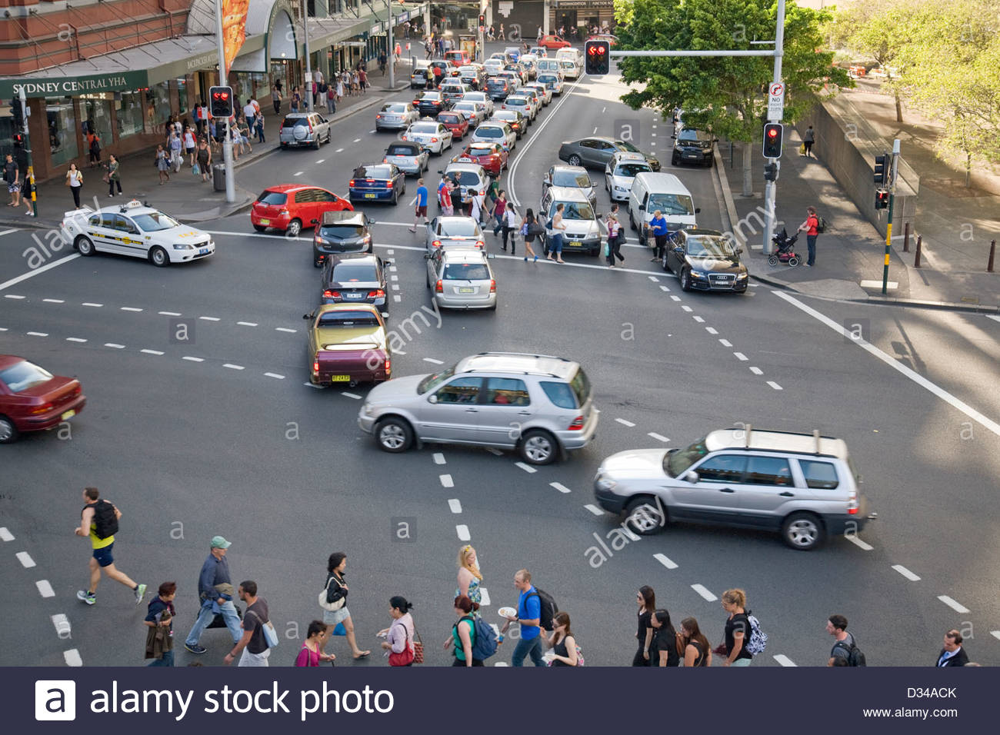

--2021-09-23 14:59:36--  https://st.hzcdn.com/simgs/7ed1a5630d4adfe5_8-1140/contemporary.jpg
Resolving st.hzcdn.com (st.hzcdn.com)... 151.101.0.93, 151.101.64.93, 151.101.128.93, ...
Connecting to st.hzcdn.com (st.hzcdn.com)|151.101.0.93|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 56045 (55K) [image/jpeg]
Saving to: ‘contemporary.jpg.1’

contemporary.jpg.1  100%[===================>]  54.73K  --.-KB/s    in 0.004s  

2021-09-23 14:59:36 (12.4 MB/s) - ‘contemporary.jpg.1’ saved [56045/56045]



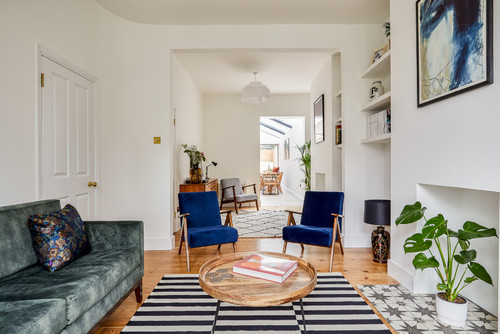

In [ ]:
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.9/index.html
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

!wget https://c8.alamy.com/comp/D34ACK/traffic-congestion-in-sydney-city-centre-D34ACK.jpg
im1 = cv2.imread("./traffic-congestion-in-sydney-city-centre-D34ACK.jpg")
cv2_imshow(im1)
!wget https://st.hzcdn.com/simgs/7ed1a5630d4adfe5_8-1140/contemporary.jpg
im2 = cv2.imread("./contemporary.jpg")
cv2_imshow(im2)

In [ ]:
model_path = "COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(model_path))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(model_path)
predictor = DefaultPredictor(cfg)
print(predictor(im1))
outputs1 = predictor(im1)
print(predictor(im2))
outputs2 = predictor(im2)

The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


{'instances': Instances(num_instances=62, image_height=956, image_width=1300, fields=[pred_boxes: Boxes(tensor([[4.6513e+02, 4.6257e+02, 7.7728e+02, 6.0558e+02],
        [9.7186e+01, 6.3193e+02, 1.8627e+02, 7.8705e+02],
        [7.6904e+02, 5.6328e+02, 1.1346e+03, 7.2007e+02],
        [7.9851e+01, 2.6167e+02, 2.8381e+02, 3.4630e+02],
        [2.3629e+02, 6.9724e+02, 3.2122e+02, 8.5507e+02],
        [8.6622e+02, 2.9728e+02, 9.7434e+02, 3.8285e+02],
        [3.9332e+02, 3.9054e+02, 5.0932e+02, 5.0805e+02],
        [9.9155e+02, 1.5913e+02, 1.0168e+03, 2.0725e+02],
        [5.5426e+02, 3.1944e+02, 6.4899e+02, 4.0550e+02],
        [1.0362e+03, 2.6667e+02, 1.0705e+03, 3.4721e+02],
        [3.7849e+02, 8.0400e+02, 4.3977e+02, 8.6782e+02],
        [1.3554e+02, 2.0209e+02, 1.5969e+02, 2.5687e+02],
        [2.9112e+02, 7.5476e+02, 3.5652e+02, 8.6864e+02],
        [1.8550e+02, 7.5474e+02, 2.3216e+02, 8.6257e+02],
        [1.1350e+03, 1.9863e+02, 1.1554e+03, 2.4140e+02],
        [1.0748e+03, 7.976

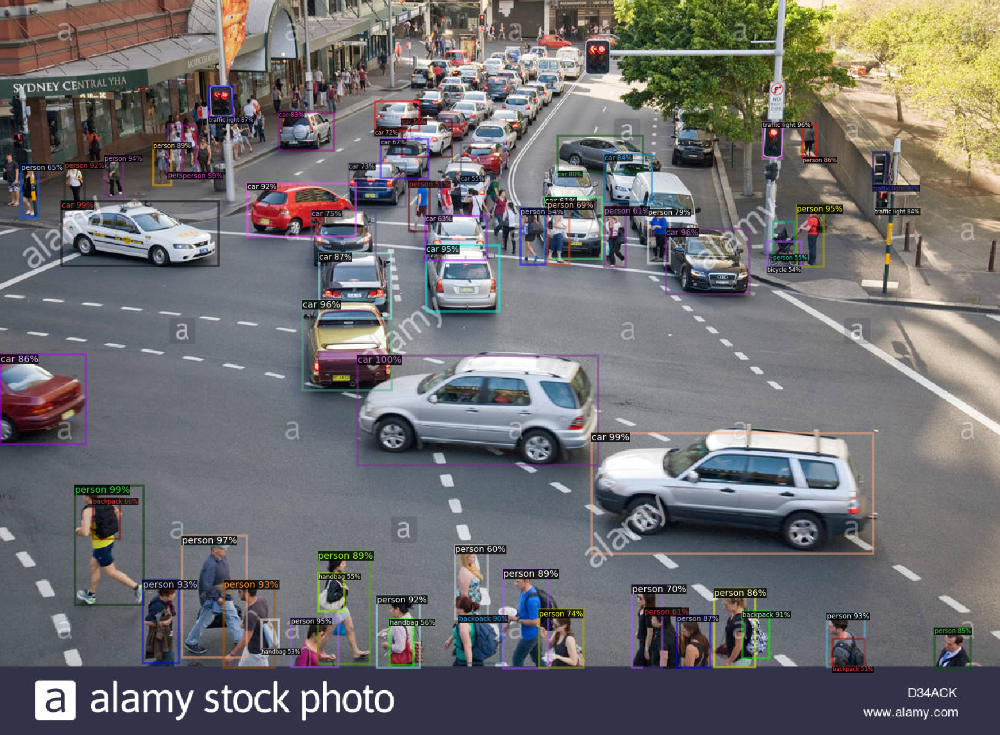

In [ ]:
v1 = Visualizer(im1[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out1 = v1.draw_instance_predictions(outputs1["instances"].to("cpu"))
cv2_imshow(out1.get_image()[:, :, ::-1])

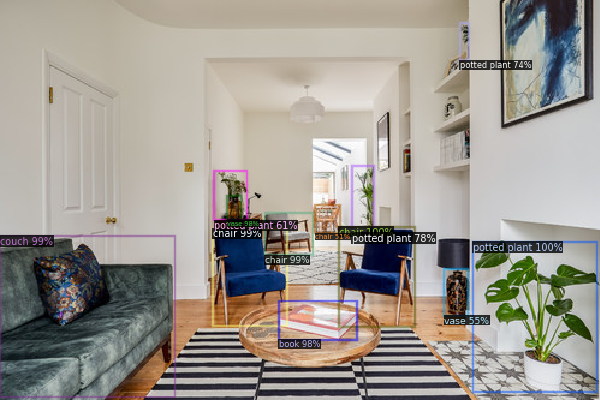

In [ ]:
v2 = Visualizer(im2[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out2 = v2.draw_instance_predictions(outputs2["instances"].to("cpu"))
cv2_imshow(out2.get_image()[:, :, ::-1])

model_final_2d9806.pkl: 431MB [01:03, 6.80MB/s]                           
The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


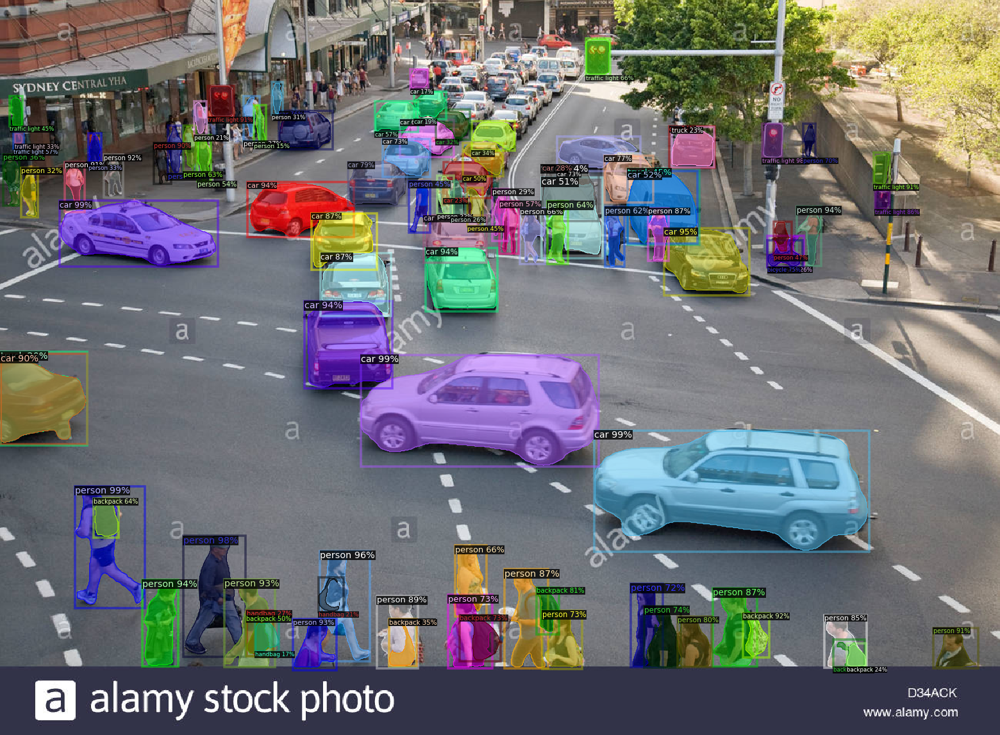

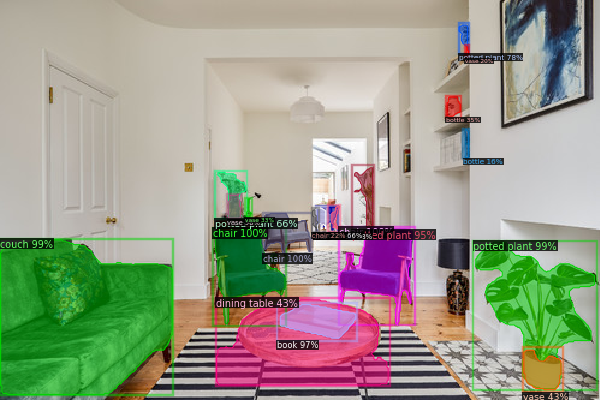

In [ ]:
model_path = "COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(model_path))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.15
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(model_path)
predictor = DefaultPredictor(cfg)
outputs1 = predictor(im1)
outputs2 = predictor(im2)

# We can use `Visualizer` to draw the predictions on the image.
v1 = Visualizer(im1[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out1 = v1.draw_instance_predictions(outputs1["instances"].to("cpu"))
cv2_imshow(out1.get_image()[:, :, ::-1])

v2 = Visualizer(im2[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out2 = v2.draw_instance_predictions(outputs2["instances"].to("cpu"))
cv2_imshow(out2.get_image()[:, :, ::-1])

--2021-09-23 15:16:51--  https://static.accupass.com/eventintro/2003280143201163114820.jpg
Resolving static.accupass.com (static.accupass.com)... 34.96.118.78
Connecting to static.accupass.com (static.accupass.com)|34.96.118.78|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [image/jpeg]
Saving to: ‘2003280143201163114820.jpg.4’

2003280143201163114     [ <=>                ] 290.76K  --.-KB/s    in 0.004s  

2021-09-23 15:16:51 (68.5 MB/s) - ‘2003280143201163114820.jpg.4’ saved [297734]



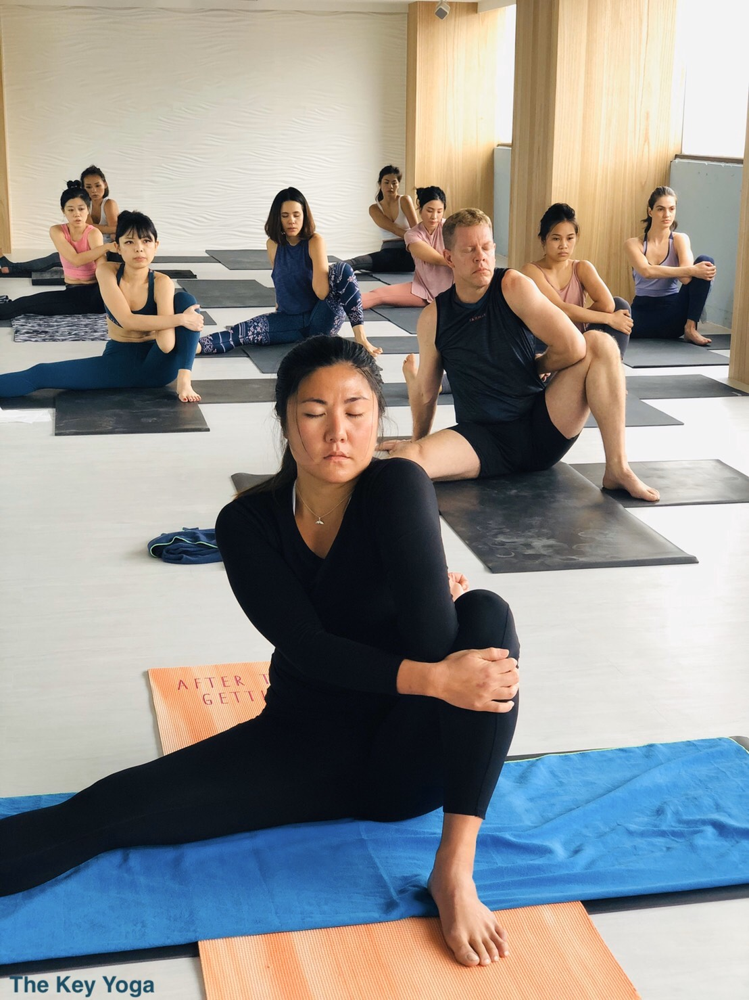

--2021-09-23 15:16:52--  https://image.cache.storm.mg/styles/smg-800x533-fp/s3/media/image/2019/07/30/20190730-062705_U7213_M539879_ba59.jpg
Resolving image.cache.storm.mg (image.cache.storm.mg)... 52.84.174.30, 52.84.174.103, 52.84.174.116, ...
Connecting to image.cache.storm.mg (image.cache.storm.mg)|52.84.174.30|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 67970 (66K) [image/jpeg]
Saving to: ‘20190730-062705_U7213_M539879_ba59.jpg.1’

20190730-062705_U72 100%[===================>]  66.38K  --.-KB/s    in 0.006s  

2021-09-23 15:16:52 (11.2 MB/s) - ‘20190730-062705_U7213_M539879_ba59.jpg.1’ saved [67970/67970]



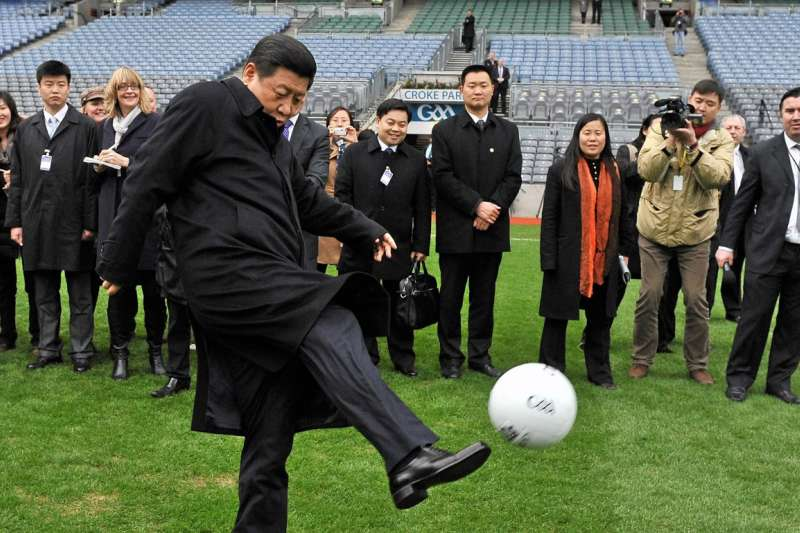

The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


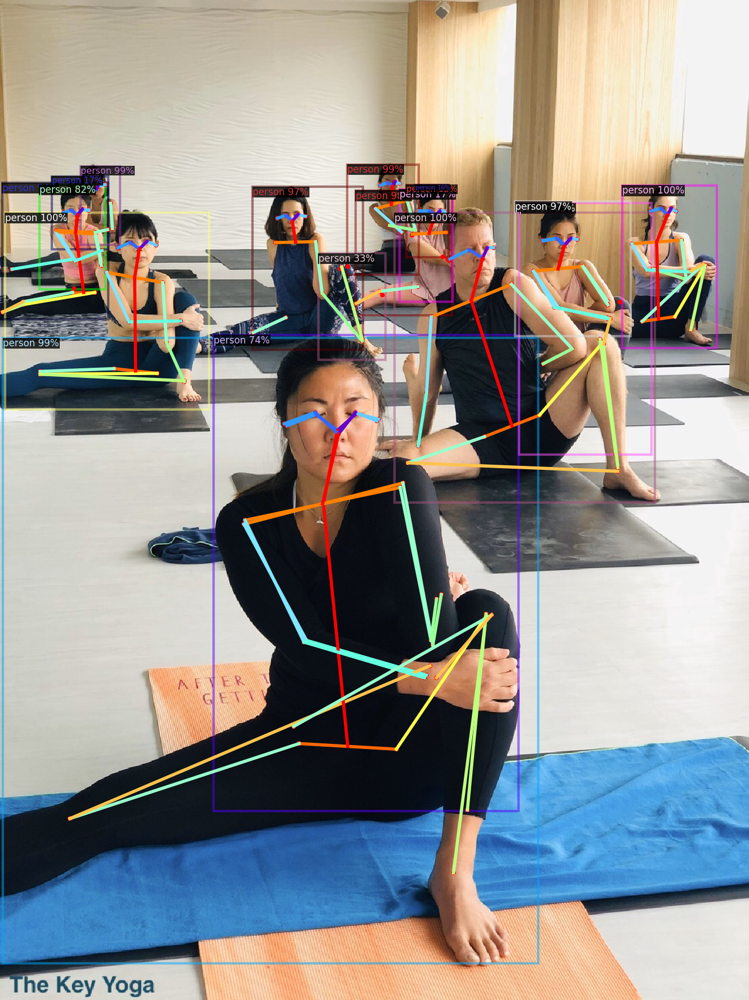

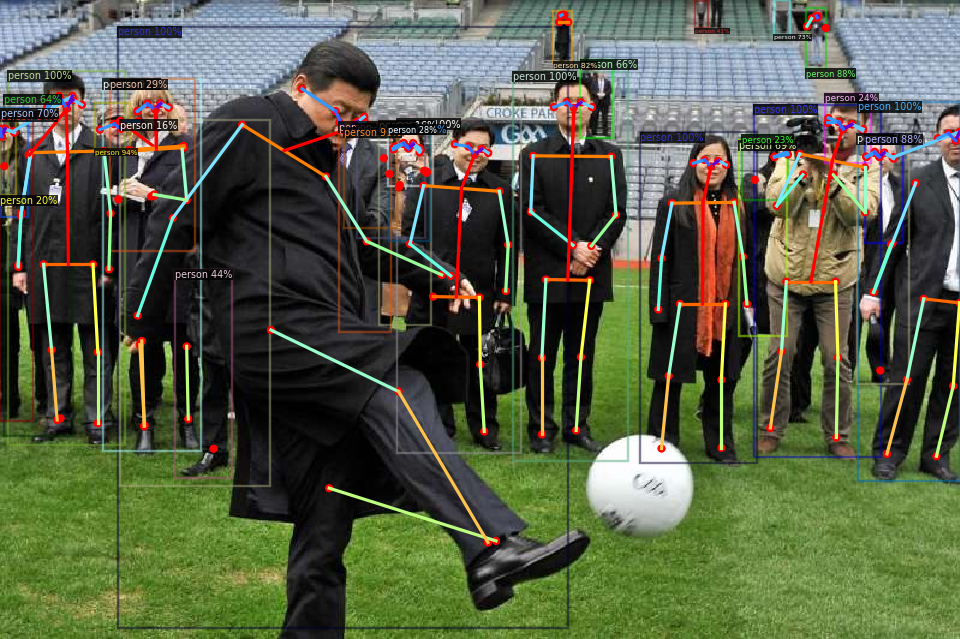

In [ ]:
!wget https://static.accupass.com/eventintro/2003280143201163114820.jpg
im1 = cv2.imread("./2003280143201163114820.jpg")
cv2_imshow(im1)
!wget https://image.cache.storm.mg/styles/smg-800x533-fp/s3/media/image/2019/07/30/20190730-062705_U7213_M539879_ba59.jpg
im2 = cv2.imread("./20190730-062705_U7213_M539879_ba59.jpg")
cv2_imshow(im2)

model_path = "COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(model_path))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.15
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(model_path)
predictor = DefaultPredictor(cfg)
outputs1 = predictor(im1)
outputs2 = predictor(im2)

v1 = Visualizer(im1[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out1 = v1.draw_instance_predictions(outputs1["instances"].to("cpu"))
cv2_imshow(out1.get_image()[:, :, ::-1])

v2 = Visualizer(im2[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out2 = v2.draw_instance_predictions(outputs2["instances"].to("cpu"))
cv2_imshow(out2.get_image()[:, :, ::-1])